<h1 style='text-align: center;'>Syarah Used Cars Price Regression</h1>

---

## Contents:  
1.  Business Problem Understanding
2.  Data Understanding
    * Initial Data Analysis
    * Exploratory Data Analysis
3.  Data Preprocessing
    * Missing Value
    * Duplicated Value
    * Outlier
    * Rare Label & Cardinality
4.  Modeling
    * Environment Setup
    * Model Experimentation
    * Model Evaluation
    * Model Prediction
5.  Conclusion

---

# Business Problem Understanding

**Context**

Syarah adalah *platform* daring yang berfokus pada bisnis jual beli mobil bekas. Syarah menyediakan katalog mobil bekas bagi para pelanggan yang berniat untuk membelinya, dan juga menyediakan layanan tukar tambah ataupun membeli mobil bekas dari pihak yang ingin menjualnya kepada Syarah. Perusahaan ini beroperasi sejak tahun 2015, dan layanannya mencakup seluruh wilayah di Arab Saudi.

Jika seseorang ingin menjual mobilnya kepada Syarah, dapat dimulai dengan mengisikan informasi seperti merk, model, tahun pembuatan, jarak tempuh, hingga daerah asal mobil tersebut ke situs website ataupun aplikasi *mobile* dari Syarah. Berikutnya perwakilan dari Syarah akan menghubungi langsung penjual tersebut untuk melakukan inspeksi dan mendokumentasi mobil yang hendak dijual. Setelah menandatangani seluruh dokumen yang diperlukan, termasuk serah terima kepemilikan dan kontrak jual beli mobil, Syarah akan mengirimkan sejumlah uang kepada penjual sesuai kesepakatan harga mobil tersebut.

**Problem Statement**

Tahapan inspeksi yang dilakukan oleh Syarah sebelum menetapkan harga beli bagi penjualnya berpotensi menjadi permasalahan dalam model bisnis jual beli mobil bekas seperti ini, karena **memerlukan waktu yang relatif lama mulai dari penjual memberikan informasi mengenai kendaraannya hingga pembeli menetapkan harga yang sesuai**. Waktu yang lama bisa membuat calon penjual mengurungkan niatnya untuk menjual mobilnya kepada Syarah, bahkan justru menjualnya kepada pihak lain.

Dengan demikian, tantangan bagi Syarah adalah menciptakan model bisnis yang menguntungkan secara finansial bagi mereka serta bagi pihak penjual mobil bekas, serta mengurangi *waiting time* yang ada dalam proses bisnis tersebut.

**Goals**

Berdasarkan permasalahan tersebut, Syarah memerlukan *tool* yang dapat membantu klien mereka (dalam hal ini penjual mobil bekas) untuk **menentukan harga mobil bekas yang tepat seketika itu juga, yakni sebelum dilakukannya inspeksi**. Beragam informasi yang membedakan antara satu mobil bekas dan yang lainnya, seperti tipe & merk, daerah asal, dan spesifikasi mobil dapat menambah akurasi prediksi harga (harga beli bagi Syarah, harga jual bagi penjual mobil bekas), sehingga dapat memberikan keuntungan dan nilai positif bagi kedua belah pihak.

Untuk Syarah, *tool* yang dapat memberikan prediksi harga beli secara *fair* dan instan akan menjadi sebuah *added value* bagi mereka. Berkurangnya waktu tunggu yang diperlukan klien Syarah untuk memutuskan apakah mereka akan menjual mobilnya atau tidak akan meningkatkan kualitas *decision-making process*, sehingga nantinya akan semakin banyak klien Syarah yang menggunakan jasa ini. Bertambahnya klien Syarah akan diiringi dengan meningkatnya tingkat kepuasan, tingkat loyalitas, dan mereka akan memberikan *review* positif setelah menerima layanan yang memuaskan dari Syarah.

**Analytic Approach**

Langkah awal untuk membuat *tool* tersebut adalah dengan menganalisis data mobil bekas, agar dapat menemukan pola dari fitur yang ada dan yang membedakan antara satu mobil bekas dengan yang lainnya. Hal ini dilakukan untuk memudahkan nantinya saat melakukan eksperimentasi untuk membangun model *prediction tool*.

Berdasarkan temuan yang didapatkan dari eksplorasi data tersebut, langkah berikutnya adalah membuat model regresi sebagai *tool* prediksi harga beli mobil bekas, yang nantinya akan digunakan oleh klien Syarah untuk mendapatkan harga jual mobil bekasnya.

**Metric Evaluation**

Evaluasi metrik yang akan digunakan adalah MAE, MSE & RMSE, serta MAPE:
1. MAE sebagai rerata nilai absolut dari *error* atau kesalahan prediksi.
2. MSE sebagai rerata kuadrat dari *error* —yang kemudian diakarkan menjadi RMSE—, serta 
4. MAPE sebagai rerata persentase *error* yang dihasilkan oleh model regresi. 

Semakin kecil nilai MAE, MSE & RMSE, serta MAPE yang dihasilkan, berarti model semakin akurat dalam memprediksi harga mobil bekas sesuai limitasi yang ada.

Selain itu, kita juga bisa menggunakan nilai *R-Squared* (R2) atau *adjusted R-squared* jika model yang nanti terpilih adalah model linear. Nilai R2 digunakan untuk mengetahui seberapa baik model dapat merepresentasikan *variance* (kuadrat dari standar deviasi) dari *target* (harga mobil bekas) yang dapat diprediksi oleh *feature* (misal merk, model, tahun pembuatan, jarak tempuh, dst.). Semakin mendekati 1, maka semakin *fit* modelnya terhadap data observasi.

# Data Understanding

In [136]:
# Importing libraries for data preparation
import pandas as pd
import docx2txt
import altair as alt
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [137]:
# Loading dataset
df_data = pd.read_csv('data_saudi_used_cars.csv')

# Showing dataset sample
df_data.head()

,Type,Region,Make,Gear_Type,Origin,Options,Year,Engine_Size,Mileage,Negotiable,Price
0,Corolla,Abha,Toyota,Manual,Saudi,Standard,2013,1.4,421000,True,0
1,Yukon,Riyadh,GMC,Automatic,Saudi,Full,2014,8.0,80000,False,120000
2,Range Rover,Riyadh,Land Rover,Automatic,Gulf Arabic,Full,2015,5.0,140000,False,260000
3,Optima,Hafar Al-Batin,Kia,Automatic,Saudi,Semi Full,2015,2.4,220000,False,42000
4,FJ,Riyadh,Toyota,Automatic,Saudi,Full,2020,4.0,49000,True,0


In [138]:
# Setting maximum column width displayed
pd.options.display.max_colwidth = 999

# Performing dataset audit
print(f'Dataset Rows, Columns: {df_data.shape[0]}, {df_data.shape[1]}')

pd.DataFrame({
    'Name': df_data.columns.values,
    'Type': df_data.dtypes.values,
    'Unique': df_data.nunique().values,
    'Sample': [df_data[column].unique() for column in df_data.columns]
}).reset_index()\
    .drop(['index'], axis=1)

Dataset Rows, Columns: 5624, 11


,Name,Type,Unique,Sample
0,Type,object,347,"[Corolla, Yukon, Range Rover, Optima, FJ, CX3, Cayenne S, Sonata, Avalon, LS, C300, Land Cruiser, Hilux, Tucson, Caprice, Sunny, Pajero, Azera, Focus, 5, Spark, Camry, Pathfinder, Accent, ML, Tahoe, Yaris, Suburban, A, Altima, Traverse, Expedition, Senta fe, Liberty, 3, X, Elantra, Land Cruiser Pickup, VTC, Malibu, The 5, A8, Patrol, Grand Cherokee, SL, Previa, SEL, Aveo, MKZ, Victoria, Datsun, Flex, GLC, ES, Edge, 6, Escalade, Innova, Navara, H1, G80, Carnival, Symbol, Camaro, Accord, Avanza, Land Cruiser 70, Taurus, C5700, Impala, Optra, S, Other, Cerato, Furniture, Murano, Explorer, LX, Pick up, Charger, H6, BT-50, Hiace, Ranger, Fusion, Rav4, Ciocca, CX9, Kona, Sentra, Sierra, Durango, CT-S, Sylvian Bus, Navigator, Opirus, Marquis, The 7, FX, Creta, ...]"
1,Region,object,27,"[Abha, Riyadh, Hafar Al-Batin, Aseer, Makkah, Dammam, Yanbu, Al-Baha, Jeddah, Hail, Khobar, Al-Ahsa, Jazan, Al-Medina, Al-Namas, Tabouk, Taef, Qassim, Arar, Jubail, Sabya, Al-Jouf, Najran, Wadi Dawasir, Qurayyat, Sakaka, Besha]"
2,Make,object,58,"[Toyota, GMC, Land Rover, Kia, Mazda, Porsche, Hyundai, Lexus, Chrysler, Chevrolet, Nissan, Mitsubishi, Ford, MG, Mercedes, Jeep, BMW, Audi, Lincoln, Cadillac, Genesis, Renault, Honda, Suzuki, Zhengzhou, Dodge, HAVAL, INFINITI, Isuzu, Changan, Aston Martin, Mercury, Great Wall, Other, Rolls-Royce, MINI, Volkswagen, BYD, Geely, Victory Auto, Classic, Jaguar, Daihatsu, Maserati, Hummer, GAC, Lifan, Bentley, Chery, Peugeot, Foton, Škoda, Fiat, Iveco, SsangYong, FAW, Tata, Ferrari]"
3,Gear_Type,object,2,"[Manual, Automatic]"
4,Origin,object,4,"[Saudi, Gulf Arabic, Other, Unknown]"
5,Options,object,3,"[Standard, Full, Semi Full]"
6,Year,int64,50,"[2013, 2014, 2015, 2020, 2019, 2012, 2016, 1998, 2011, 2008, 1982, 1985, 2018, 1983, 2021, 2017, 2002, 2010, 2009, 2004, 2001, 1986, 2007, 1999, 2005, 1977, 1991, 2003, 1995, 2006, 1997, 1993, 1996, 2000, 1990, 1965, 1980, 1987, 1994, 1988, 1989, 1978, 2022, 1975, 1964, 1984, 1979, 1992, 1963, 1981]"
7,Engine_Size,float64,71,"[1.4, 8.0, 5.0, 2.4, 4.0, 2.0, 4.8, 3.5, 4.6, 5.7, 2.7, 1.0, 3.0, 1.6, 1.5, 3.3, 6.2, 2.5, 5.3, 3.6, 5.4, 1.7, 3.7, 9.0, 4.7, 4.5, 3.8, 5.5, 2.6, 1.8, 1.2, 6.0, 6.9, 3.2, 5.9, 2.2, 5.6, 1.1, 2.9, 4.1, 1.3, 4.4, 2.8, 3.4, 8.8, 6.1, 7.0, 1.9, 7.5, 4.3, 6.5, 3.1, 6.3, 6.4, 5.8, 8.5, 2.3, 6.6, 7.2, 4.2, 5.1, 7.4, 5.2, 2.1, 6.7, 7.8, 3.9, 8.7, 4.9, 6.8, 8.9]"
8,Mileage,int64,1716,"[421000, 80000, 140000, 220000, 49000, 25000, 189000, 155, 110864, 300, 200, 79000, 299000, 17000, 209, 340000, 30000, 71000, 85000, 500000, 290, 74715, 250, 284000, 98000, 3400, 108, 350000, 550000, 204000, 139240, 296, 105920, 187000, 10000, 18500, 292000, 280000, 270000, 345500, 110000, 247000, 55800, 92000, 27000, 600000, 307801, 62000, 38000, 89000, 137000, 422000, 208000, 11000, 245000, 500, 150000, 81000, 156000, 42000, 228000, 24000, 266000, 98100, 182000, 210800, 88000, 214000, 82808, 4000, 417970, 70000, 115, 270373, 91440, 45000, 96000, 50100, 35449, 180, 66200, 100, 349000, 168000, 105000, 130000, 212000, 139740, 256, 280, 73000, 240000, 866, 216, 183000, 148000, 4358765, 188257, 117000, 160000, ...]"
9,Negotiable,bool,2,"[True, False]"


In [139]:
# Generating descriptive statistics for dataset
display(df_data.describe().T, df_data.describe(include=['object', 'bool']).T)

,count,mean,std,min,25%,50%,75%,max
Year,5624.0,2014.101885,5.791606,1963.0,2012.0,2016.0,2018.0,2022.0
Engine_Size,5624.0,3.295430,1.515108,1.0,2.0,3.0,4.5,9.0
Mileage,5624.0,150923.375000,382835.963005,100.0,38000.0,103000.0,196000.0,20000000.0
Price,5624.0,53074.058144,70155.340614,0.0,0.0,36500.0,72932.5,850000.0


,count,unique,top,freq
Type,5624,347,Land Cruiser,269
Region,5624,27,Riyadh,2272
Make,5624,58,Toyota,1431
Gear_Type,5624,2,Automatic,4875
Origin,5624,4,Saudi,4188
Options,5624,3,Full,2233
Negotiable,5624,2,False,3828


In [140]:
# Loading dataset dictionary
text = docx2txt.process(docx='Saudi Arabia Used Cars.docx')
print(text)

Saudi Arabia Used Cars

Context

The dataset contains 5624 records of used cars collected from syarah.com. Each row represents a used car. Other information regarding each car is the brand name, model, manufacturing year, origin, options, engine capacity, transmission type, mileage that the car covered, region price, and negotiable.

Features

Type: Type of used car.

Region: The region in which the used car was offered for sale.

Make: The company name.

Gear_Type: Gear type size of used car.

Origin: Origin of used car.

Options: Options of used car.

Year: Manufacturing year.

Engine_Size: The engine size of used car.

Mileage: Mileage of used car	

Negotiable: True if the price is 0, that means it is negotiable.

Price: Used car price.


Secara keseluruhan, dari proses <i>data understanding & auditing</i> ini kita dapat melihat beberapa temuan berikut:
* Dataset merupakan data mobil bekas yang dihimpun dari <a href="https://syarah.com/">syarah.com</a>.
* Setiap baris data merepresentasikan satu unit mobil bekas tertentu, dan setiap kolom adalah variabel terkait mobil tersebut.
* Kolom `Type` mengacu pada model dari merk (`Make`) mobil tertentu; semisal Toyota (merk) Corolla (model).  
  `Type` mobil yang benar misalnya berupa SUV, <i>sedan, crossover, pickup, hatchback, van, & sport</i>.
* Kolom `Region` berisikan 13 wilayah administratif (provinsi) ditambah 14 kota besar di Arab Saudi yang menjadi cakupan bisnis dari Syarah.
* Kolom `Origin` adalah negara asal importir mobil bekas, yakni:
  1. Arab Saudi, 
  2. Negara yang tergabung dalam <i>Gulf Cooperation Council</i> atau GCC (negara dalam wilayah Arab Teluk yakni Bahrain, Kuwait, Oman, Qatar, Uni Emirat Arab, termasuk Arab Saudi), serta
  3. Negara lainnya.
  * Terdapat [perbedaan](https://insurancemarket.ae/car-insurance/understanding-gcc-and-non-gcc-vehicles/) antara mobil yang berasal dari negara GCC dan non-GCC, terutama pada faktor harga mobil tersebut. Dan karena Syarah beroperasi di Arab Saudi, diasumsikan bahwa beberapa faktor seperti nilai CIF (*cost, insurance, & freight*) untuk mobil dari Arab Saudi lebih rendah daripada mobil dari wilayah GCC maupun non-GCC, yang berpengaruh pada harga mobil tersebut.
* Kolom `Options` merujuk pada kelengkapan fitur pada mobil bekas tersebut:  
  Beberapa mobil memiliki versi/tingkat kelengkapan fitur (misal fitur <i>comfort, safety, & technology</i>) mulai dari yang tertinggi/paling lengkap (<i>Full</i>), setengah lengkap (<i>Semi Full</i>), dan yang terendah (<i>Standard</i>).
* Kolom `Year` dan `Engine_Size` tidak seharusnya bertipe numerik (tidak masuk akal untuk membuat rerata dan simpangan deviasi dari tahun dan ukuran mesin), namun tetap dapat digunakan dalam analisis ini, seperti untuk menganalisis korelasi, mendeteksi <i>outlier</i> dalam data, & dalam pemodelan prediksi.
* Kolom `Mileage` dan `Price` memiliki rentang/skala yang besar (masing-masing antara 100 - 20.000.000 dan 0 - 850.000), serta diasumsikan satuan unit yang digunakan dalam `Price` adalah Riyal Saudi (SAR).

Kolom `Price` akan menjadi *target* kita nantinya, karena kita akan memprediksi harga mobil bekas berdasarkan variabel atau *feature* mobil tersebut.

## Initial Data Analysis

In [141]:
# Handling large datasets
alt.data_transformers.disable_max_rows()

# Visualizing 'Type' column
base = alt.Chart(data=df_data).encode(
    y=alt.Y(shorthand='Type', axis=alt.Axis(titleAngle=0)).sort('-x'),
    x=alt.X(shorthand='count()', title='Count'),
    text=alt.Text('count()')
).properties(
    title='Used Cars Type Distribution',
    width=750, height=5000,
)

base.mark_bar() + base.mark_text(align='left', dx=10)

alt.LayerChart(...)

Patut diperhatikan adanya beberapa `Type` dengan frekuensi yang rendah, mulai dari rentang 1 hingga 10.

In [142]:
# Visualizing 'Region' column
base = alt.Chart(data=df_data).encode(
    y=alt.Y('Region', axis=alt.Axis(titleAngle=0)).sort('-x'),
    x=alt.X(shorthand='count()', title='Count'),
    text=alt.Text('count()')
).properties(
    title='Used Cars Region Distribution',
    width=750, height=1000,
)

base.mark_bar() + base.mark_text(align='left', dx=10)

alt.LayerChart(...)

Riyadh adalah `Region` yang paling mendominasi, yakni sebanyak 2272 data atau sekitar 40% dari keseluruhan dataset.

In [143]:
# Visualizing 'Make' column
base = alt.Chart(data=df_data).encode(
    y=alt.Y(shorthand='Make', axis=alt.Axis(titleAngle=0)).sort('-x'),
    x=alt.X(shorthand='count()', title='Count'),
    text=alt.Text('count()')
).properties(
    title='Used Cars Make Distribution',
    width=750, height=1000,
)

base.mark_bar() + base.mark_text(align='left', dx=10)

alt.LayerChart(...)

Juga ditemukan label dengan frekuensi yang rendah pada kolom `Make`; dari rentang 1 hingga 9.

In [144]:
# Visualizing 'Gear_Type' column
base = alt.Chart(data=df_data).encode(
    x=alt.X('Gear_Type', axis=alt.Axis(labelAngle=0)).sort('-y'),
    y=alt.Y(shorthand='count()', title='Count', axis=alt.Axis(titleAngle=0, titleX=-60)),
    text=alt.Text('count()')
).properties(
    title='Used Cars Gear Type Distribution',
    width=500, height=500,
)

base.mark_bar() + base.mark_text(align='center', dy=-10)

alt.LayerChart(...)

Label `Automatic` juga mendominasi kolom `Gear_Type`; sebanyak 4875 observasi atau 86% dari dataset.

In [145]:
# Visualizing 'Origin' column
base = alt.Chart(data=df_data).encode(
    x=alt.X('Origin', axis=alt.Axis(labelAngle=0)).sort('-y'),
    y=alt.Y(shorthand='count()', title='Count', axis=alt.Axis(titleAngle=0, titleX=-60)),
    text=alt.Text('count()')
).properties(
    title='Used Cars Origin Distribution',
    width=500, height=500,
)

base.mark_bar() + base.mark_text(align='center', dy=-10)

alt.LayerChart(...)

Frekuensi label Saudi pada kolom `Origin` lebih besar daripada yang lain, yakni senilai 4.188 data atau 74% dari keseluruhan dataset.

In [146]:
# Visualizing 'Options' column
base = alt.Chart(data=df_data).encode(
    x=alt.X('Options', axis=alt.Axis(labelAngle=0)).sort('-y'),
    y=alt.Y(shorthand='count()', title='Count', axis=alt.Axis(titleAngle=0, titleX=-60)),
    text=alt.Text('count()')
).properties(
    title='Used Cars Options Distribution',
    width=500, height=500,
)

base.mark_bar() + base.mark_text(align='center', dy=-10)

alt.LayerChart(...)

Proporsi label pada kolom `Options` relatif berimbang dan tidak ada yang paling mendominasi.

In [147]:
# Visualizing 'Year' Column
alt.Chart(data=df_data).mark_boxplot().encode(
    x=alt.X('Year').scale(zero=False),
).properties(
    title='Used Cars Year Distribution',
    width=1000,
    height=100
)

alt.Chart(...)

Distribusi data pada kolom `Year` condong ke kiri (*negative skewed*); ditandai dengan beberapa *outliers* di sisi kiri grafik.

In [148]:
# Visualizing 'Engine_Size' Column
alt.Chart(data=df_data).mark_boxplot().encode(
    x='Engine_Size',
).properties(
    title='Used Cars Engine Size Distribution',
    width=1000,
    height=100
)

alt.Chart(...)

Distribusi data pada kolom `Engine_Size` condong ke kanan (*positive skewed*); ditandai dengan beberapa *outliers* di sisi kanan grafik.

In [149]:
# Visualizing 'Mileage' Column
alt.Chart(data=df_data).mark_boxplot().encode(
    x='Mileage',
).properties(
    title='Used Cars Mileage Distribution',
    width=1000,
    height=100
)

alt.Chart(...)

Distribusi data pada kolom `Mileage` condong ke kanan (*positive skewed*) secara signifikan; ditandai dengan *outliers* yang bernilai ekstrim.

In [150]:
# Visualizing 'Negotiable' column
base = alt.Chart(data=df_data).encode(
    x=alt.X('Negotiable', axis=alt.Axis(labelAngle=0)).sort('-y'),
    y=alt.Y(shorthand='count()', title='Count', axis=alt.Axis(titleAngle=0, titleX=-60)),
    text=alt.Text('count()')
).properties(
    title='Used Cars Negotiable Distribution',
    width=500, height=500,
)

base.mark_bar() + base.mark_text(align='center', dy=-10)

alt.LayerChart(...)

1796 data memiliki label *true* pada kolom `Negotiable`. Dengan kata lain, 32% data memiliki nilai 0 pada kolom `Price`.

In [151]:
# Visualizing 'Price' Column
alt.Chart(data=df_data).mark_boxplot().encode(
    x='Price',
).properties(
    title='Used Cars Price Distribution',
    width=1000,
    height=100
)


alt.Chart(...)

Distribusi data pada kolom `Price` juga condong ke kanan, disertai dengan beberapa nilai *outliers*. Dengan demikian, pengukuran pusat yang sesuai untuk kolom ini adalah dengan menggunakan nilai median.

## Exploratory Data Analysis

In [152]:
# Visualizing 'Type' column based on median 'Price'
base = alt.Chart(data=df_data.groupby(by='Type')\
                 .agg(func={'Price': 'median'})\
                    .sort_values(by='Price', ascending=False)\
                        .reset_index())\
                            .encode(
    y=alt.Y(shorthand='Type', axis=alt.Axis(titleAngle=0)).sort('-x'),
    x=alt.X(shorthand='Price', title='median'),
    text=alt.Text('Price')
).properties(
    title='Used Cars Type Distribution Based on Median Price',
    width=750, height=5000,
)

base.mark_bar() + base.mark_text(align='left', dx=10)

alt.LayerChart(...)

Jika dibandingkan dengan temuan sebelumnya, `Type` dengan frekuensi yang rendah seperti Bentayga (1), Camargue (1), dan Ghost (2) justru menjadi tiga `Type` yang memiliki nilai median `Price` tertinggi.

Serta beberapa `Type` tanpa nilai median `Price` dikarenakan adanya label *true* pada kolom `Negotiable` dari `Type` tersebut.

In [153]:
# Visualizing 'Region' column based on median 'Price'
base = alt.Chart(data=df_data.groupby(by='Region')\
                 .agg(func={'Price': 'median'})\
                    .sort_values(by='Price', ascending=False)\
                        .reset_index())\
                            .encode(
    y=alt.Y(shorthand='Region', axis=alt.Axis(titleAngle=0)).sort('-x'),
    x=alt.X(shorthand='Price', title='median'),
    text=alt.Text('Price')
).properties(
    title='Used Cars Region Distribution Based on Median Price',
    width=750, height=1000,
)

base.mark_bar() + base.mark_text(align='left', dx=10)

alt.LayerChart(...)

`Region` dengan frekuensi yang rendah seperti Al-Namas memiliki nilai median `Price` yang relatif tinggi. Sedangkan yang lainnya seperti Sabya, Sakaka, dst. adalah label dengan frekuensi dan nilai median `Price` yang sama-sama rendah.

In [154]:
# Visualizing 'Make' column based on median 'Price'
base = alt.Chart(data=df_data.groupby(by='Make')\
                 .agg(func={'Price': 'median'})\
                    .sort_values(by='Price', ascending=False)\
                        .reset_index())\
                            .encode(
    y=alt.Y(shorthand='Make', axis=alt.Axis(titleAngle=0)).sort('-x'),
    x=alt.X(shorthand='Price', title='median'),
    text=alt.Text('Price')
).properties(
    title='Used Cars Make Distribution Based on Median Price',
    width=750, height=1000,
)

base.mark_bar() + base.mark_text(align='left', dx=10)

alt.LayerChart(...)

`Make` dengan frekuensi yang rendah seperti Rolls Royce (3), Aston Martin (2), dan Ferrari (1) juga menjadi tiga `Make` dengan nilai median `Price` tertinggi.

Ditemukan juga label dengan frekuensi dan nilai median `Price` yang rendah yakni Daihatsu (9), Hummer (5), Isuzu (25), Tata (1), SsangYong (1), dan Great Wall (4).

*Other* (10) adalah representasi dari `Make` atau produsen mobil lain yang tidak disebutkan namanya dalam dataset ini.

In [155]:
# Visualizing 'Gear_Type' column based on median 'Price'
base = alt.Chart(data=df_data.groupby(by='Gear_Type')\
                 .agg(func={'Price': 'median'})\
                    .sort_values(by='Price', ascending=False)\
                        .reset_index())\
                            .encode(
    x=alt.X('Gear_Type', axis=alt.Axis(labelAngle=0)).sort('-y'),
    y=alt.Y(shorthand='Price', title='Price', axis=alt.Axis(titleAngle=0, titleX=-60)),
    text=alt.Text('Price')
).properties(
    title='Used Cars Gear Type Distribution Based on Median Price',
    width=500, height=500,
)

base.mark_bar() + base.mark_text(align='center', dy=-10)

alt.LayerChart(...)

`Gear_Type` dengan label *automatic* sama-sama memiliki frekuensi dan nilai median `Price` yang lebih tinggi daripada *manual*.

In [156]:
# Visualizing 'Origin' column based on median 'Price'
base = alt.Chart(data=df_data.groupby(by='Origin')\
                 .agg(func={'Price': 'median'})\
                    .sort_values(by='Price', ascending=False)\
                        .reset_index())\
                            .encode(
    x=alt.X('Origin', axis=alt.Axis(labelAngle=0)).sort('-y'),
    y=alt.Y(shorthand='Price', title='Price', axis=alt.Axis(titleAngle=0, titleX=-60)),
    text=alt.Text('Price')
).properties(
    title='Used Cars Origin Distribution Based on Median Price',
    width=500, height=500,
)

base.mark_bar() + base.mark_text(align='center', dy=-10)

alt.LayerChart(...)

Meskipun frekuensi `Origin` dengan label Saudi lebih tinggi, tetapi nilai median `Price` pada label `Gulf Arabic` yang lebih besar.

In [157]:
# Visualizing 'Options' column based on median 'Price'
base = alt.Chart(data=df_data.groupby(by='Options')\
                 .agg(func={'Price': 'median'})\
                    .sort_values(by='Price', ascending=False)\
                        .reset_index())\
                            .encode(
    x=alt.X('Options', axis=alt.Axis(labelAngle=0)).sort('-y'),
    y=alt.Y(shorthand='Price', title='Price', axis=alt.Axis(titleAngle=0, titleX=-60)),
    text=alt.Text('Price')
).properties(
    title='Used Cars Options Distribution Based on Median Price',
    width=500, height=500,
)

base.mark_bar() + base.mark_text(align='center', dy=-10)

alt.LayerChart(...)

Secara *domain knowledge*, mobil bekas dengan `Options` atau kelengkapan fitur mulai dari urutan tertinggi seharusnya juga memiliki harga yang lebih tinggi.  
Proporsi yang berimbang antara nilai median `Price` untuk label Semi Full dan Standard bisa berasal dari data dengan `Price` 0 dari label *true* di kolom `Negotiable`.

Untuk mengeksplor hal ini lebih jauh, kita perlu menghilangkan data tersebut. Dan sesuai dengan hipotesa tersebut, visualisasinya ditunjukkan pada grafik di bawah ini.

In [158]:
# Visualizing 'Options' column based on modified median 'Price'
base = alt.Chart(data=df_data[df_data['Price'] != 0].groupby(by='Options')\
                 .agg(func={'Price': 'median'})\
                    .sort_values(by='Price', ascending=False)\
                        .reset_index())\
                            .encode(
    x=alt.X('Options', axis=alt.Axis(labelAngle=0)).sort('-y'),
    y=alt.Y(shorthand='Price', title='Price', axis=alt.Axis(titleAngle=0, titleX=-60)),
    text=alt.Text('Price')
).properties(
    title='Used Cars Options Distribution Based on Median Price (Modified)',
    width=500, height=500,
)

base.mark_bar() + base.mark_text(align='center', dy=-10)

alt.LayerChart(...)

In [159]:
# Analyzing correlation of numeric features
df_corr = df_data.corr(numeric_only=True)

# Converting correlation results to long format for visualization process
df_corr = df_corr.stack()\
                    .reset_index(name='Correlation')\
                        .rename(columns={'level_0':'Variable 1','level_1':'Variable 2'})

# Visualizing correlation heatmap
heatmap = alt.Chart(df_corr).mark_rect().encode(
    x=alt.X(shorthand='Variable 1', title=None, sort='-y', axis=alt.Axis(labelAngle=0)),
    y=alt.Y(shorthand='Variable 2', title=None, sort='-x'),
    color='Correlation'
).properties(
    title='Correlation Matrix',
    width=500,
    height=500
)

# Adding text annotations
text = heatmap.mark_text(baseline='middle').encode(
    text=alt.Text('Correlation', format='.2f'),
    color=alt.condition(
        alt.datum['Correlation'] > 0.5,
        alt.value('white'),
        alt.value('black')
    )
)

heatmap + text

alt.LayerChart(...)

Untuk korelasi antara kolom-kolom numerik & *boolean* dengan kolom `Price`, korelasi positif terdapat pada kolom `Year` dan `Engine_Size`. Artinya seiring meningkatnya nilai pada `Year` dan `Engine_Size`, nilai `Price` juga turut meningkat. Sebaliknya, seiring meningkatnya nilai pada `Mileage`, nilai `Price` justru menurun.

Tidak ada korelasi yang kuat (multikolinearitas) pada dataset ini, karena koefisien korelasi tertinggi —yakni pada kolom `Year`— hanya sebesar 0.29.

---

# Data Preprocessing

Temuan pada tahapan sebelumnya akan menjadi landasan utama untuk memproses data pada bagian ini, agar menjadi *input* yang baik pada tahap pemodelan.

Serta untuk tahapan ini, kita akan menggunakan *dataframe* hasil duplikasi dari dataframe awal, untuk menghindari *chained indexing*.

In [160]:
# Making copy of dataset
df_model = df_data.copy()

In [161]:
# Importing libraries for data preprocessing
from sklearn.impute import SimpleImputer
from feature_engine.outliers import OutlierTrimmer
from sklearn.preprocessing import FunctionTransformer
import statsmodels.api as sm
from feature_engine.encoding import RareLabelEncoder

## Missing Value

In [162]:
# Detecting missing values
pd.DataFrame({
    'Name': df_model.columns.values,
    'N/A (n)': df_model.isna().sum()
}).reset_index()\
    .drop(['index'], axis=1)

,Name,N/A (n)
0,Type,0
1,Region,0
2,Make,0
3,Gear_Type,0
4,Origin,0
5,Options,0
6,Year,0
7,Engine_Size,0
8,Mileage,0
9,Negotiable,0


Ternyata kita tidak mendeteksi adanya *missing value* dengan menggunakan `isna()`, atau tidak ada data yang bernilai `None` atau `NaN`. Sedangkan *missing value* juga bisa dicirikan dengan nilai lain seperti `Unknown`, `-1`, `?`, `miss`, hingga angka seperti `999999`. Untuk mendeteksi nilai-nilai ini, kita dapat melihat *unique value* pada tiap kolom dataframe, serta dengan berpedoman pada tahapan *exploratory data analysis* yang telah kita lakukan sebelumnya.

### Missing Value: `Origin`

In [163]:
# Finding unique values of 'Origin' column
df_model['Origin'].unique()

array(['Saudi', 'Gulf Arabic', 'Other', 'Unknown'], dtype=object)

Terdapat *missing value* berupa `Unknown` pada kolom `Origin`. Untuk menentukan mekanismenya, mari kita *filter* dataframe sesuai *missing value ini*.

In [164]:
# Filtering dataframe based on 'Unknown' missing value
display(df_model[df_model['Origin'] == 'Unknown'])

(len(df_model[df_model['Origin'] == 'Unknown'])) / (len(df_model))

,Type,Region,Make,Gear_Type,Origin,Options,Year,Engine_Size,Mileage,Negotiable,Price
63,Land Cruiser Pickup,Qassim,Nissan,Manual,Unknown,Full,2016,4.8,42000,True,0
133,Land Cruiser,Riyadh,Toyota,Automatic,Unknown,Full,2014,4.6,191000,True,0
252,CX9,Abha,Mazda,Automatic,Unknown,Full,2012,2.5,377836,True,0
253,Sorento,Jubail,Kia,Automatic,Unknown,Semi Full,2015,3.3,133981,True,0
276,Charger,Riyadh,Dodge,Automatic,Unknown,Full,2020,3.6,9120,False,115000
...,...,...,...,...,...,...,...,...,...,...,...
5350,Sonata,Al-Ahsa,Hyundai,Automatic,Unknown,Semi Full,2016,2.4,258000,False,38000
5413,Camry,Riyadh,Toyota,Automatic,Unknown,Standard,2016,2.5,254000,True,0
5449,Land Cruiser,Tabouk,Toyota,Manual,Unknown,Full,1995,4.6,300000,False,20000
5481,Elantra,Al-Jouf,Hyundai,Automatic,Unknown,Standard,2016,2.0,120000,True,0


0.010846372688477952

Terlihat tidak ada indikasi bahwa *missing value* di kolom `Origin` berkaitan dengan kolom/variabel lainnya; berdasarkan kolom lain, *missing value* terjadi secara acak. Sehingga hal ini dapat dikatakan sebagai *missing completely at random* (MCAR).

Persentase *missing value* ini juga tidak besar. Dengan demikian, dapat dilakukan imputasi menggunakan modus dari kolom `Origin` (diasumsikan bahwa pola data pada `Unknown` mirip dengan pola mayoritas/modus data pada variabel `Origin`)

In [165]:
# Imputing missing values on 'Origin' column
df_model[['Origin']] = SimpleImputer(missing_values='Unknown', strategy='most_frequent').fit_transform(df_model[['Origin']])

# Validating imputation process
df_model['Origin'].unique()

array(['Saudi', 'Gulf Arabic', 'Other'], dtype=object)

### Missing Value: `Mileage`

In [166]:
# Finding unique values of 'Mileage' Column
sorted(df_model['Mileage'].unique(), reverse=True)

[20000000,
 9999999,
 4900000,
 4691232,
 4500000,
 4358765,
 4010000,
 4000000,
 3700562,
 3640000,
 3500000,
 3300000,
 3275230,
 3187031,
 3180003,
 3150000,
 3000000,
 2800000,
 2500000,
 2149656,
 2013000,
 2002500,
 2000000,
 1910000,
 1700000,
 1500000,
 1111111,
 1100000,
 1060204,
 1000000,
 950000,
 900000,
 860000,
 801500,
 800000,
 750000,
 749000,
 718314,
 708000,
 700000,
 650000,
 640000,
 625538,
 606645,
 600000,
 595000,
 585000,
 573000,
 570713,
 570000,
 563000,
 560000,
 556809,
 556000,
 555555,
 550000,
 546473,
 545000,
 542966,
 541000,
 540000,
 533399,
 533000,
 532000,
 530500,
 530000,
 523000,
 520000,
 515984,
 500000,
 498000,
 497480,
 495000,
 492360,
 492000,
 490000,
 489181,
 488000,
 487100,
 480000,
 479364,
 476000,
 475000,
 472000,
 470000,
 468000,
 465000,
 462000,
 460000,
 458312,
 457000,
 456300,
 455000,
 454000,
 452800,
 452000,
 450000,
 448000,
 446000,
 445539,
 445250,
 442050,
 442000,
 440000,
 439000,
 437000,
 433000,
 43234

Kolom `Mileage` memiliki data dengan nilai `9999999`, yang sesuai dengan karakteristik *missing value*. Akan tetapi, secara *domain knowledge*, hal ini masih dimungkinkan, karena jarak tempuh dari suatu mobil bisa mencapai besaran angka ini; ditambah jika mobil tersebut rutin mencatatkan jarak tempuhnya setiap kali odometernya mencapai angka maksimal.

Dengan demikian, data ini tidak dianggap sebagai *missing value*.

### Missing Value: `Price`

Pada dataset ini juga terdapat kasus *missing value* yang terjadi secara sistematis: jika suatu mobil bekas memiliki nilai `True` pada kolom `Negotiable`, maka nilai `Price` dari mobil bekas tersebut akan bernilai `0`. Tidak ada harga yang ditentukan untuk mobil bekas ini karena sifatnya dapat ditawar (*negotiable*).

In [167]:
# Validating 'Price' equals 0 when 'Negotiable' equals 'True'
df_model[df_model['Negotiable'] == True]['Price'].unique()

array([0], dtype=int64)

Sehingga data ini bisa disebut dengan *missing value not at random* (MNAR).

In [168]:
# Filtering dataframe based on '0' missing value
display(df_model[df_model['Price'] == 0])

print(f'''Percentage: {round(number=(len(df_model[df_model['Price'] == 0])) / (len(df_model)) * 100, ndigits=1)}%''')

,Type,Region,Make,Gear_Type,Origin,Options,Year,Engine_Size,Mileage,Negotiable,Price
0,Corolla,Abha,Toyota,Manual,Saudi,Standard,2013,1.4,421000,True,0
4,FJ,Riyadh,Toyota,Automatic,Saudi,Full,2020,4.0,49000,True,0
9,LS,Aseer,Lexus,Automatic,Saudi,Full,1998,4.6,300,True,0
14,Hilux,Yanbu,Toyota,Automatic,Saudi,Full,2014,2.7,209,True,0
15,Land Cruiser,Aseer,Toyota,Manual,Gulf Arabic,Semi Full,1982,4.6,340000,True,0
...,...,...,...,...,...,...,...,...,...,...,...
5610,Town Car,Jeddah,Lincoln,Automatic,Other,Full,1999,5.0,343,True,0
5614,Victoria,Makkah,Ford,Automatic,Saudi,Standard,2010,4.6,345000,True,0
5617,Yukon,Jubail,GMC,Automatic,Saudi,Semi Full,2006,5.3,300,True,0
5620,Altima,Jeddah,Nissan,Automatic,Saudi,Semi Full,2020,2.5,58000,True,0


Percentage: 32.0%


Namun data ini mencakup 32 persen dari keseluruhan dataset. Kombinasi dari sifat *missing value* dan persentase yang tinggi ini tidak memungkinkan untuk diterapkan metode imputasi apa pun (jika dilakukan imputasi juga akan mengganggu distribusi awal dari data).

Oleh sebab itu, diputuskan untuk tidak menyertakan *missing value* ini dari dataset beserta kolom `Negotiable` yang menjadi indikatornya.

In [169]:
# Filtering missing value
df_model = df_model[df_model['Price'] != 0]

# Dropping unused column
df_model.drop(labels='Negotiable', axis=1, inplace=True)

## Duplicated Value

In [170]:
# Detecting duplicated values/data
df_model[df_model.duplicated()]

,Type,Region,Make,Gear_Type,Origin,Options,Year,Engine_Size,Mileage,Price
953,Rio,Riyadh,Kia,Automatic,Saudi,Standard,2016,1.4,270000,25000
4646,Sonata,Jeddah,Hyundai,Automatic,Saudi,Standard,2020,2.4,100,72910
4933,Tucson,Dammam,Hyundai,Automatic,Saudi,Standard,2016,2.0,155000,45000


In [171]:
# Viewing duplicated data
df_model[df_model.duplicated(keep=False)].sort_values(by='Type')

,Type,Region,Make,Gear_Type,Origin,Options,Year,Engine_Size,Mileage,Price
540,Rio,Riyadh,Kia,Automatic,Saudi,Standard,2016,1.4,270000,25000
953,Rio,Riyadh,Kia,Automatic,Saudi,Standard,2016,1.4,270000,25000
236,Sonata,Jeddah,Hyundai,Automatic,Saudi,Standard,2020,2.4,100,72910
4646,Sonata,Jeddah,Hyundai,Automatic,Saudi,Standard,2020,2.4,100,72910
2012,Tucson,Dammam,Hyundai,Automatic,Saudi,Standard,2016,2.0,155000,45000
4933,Tucson,Dammam,Hyundai,Automatic,Saudi,Standard,2016,2.0,155000,45000


Terdeteksi 3 data yang terduplikasi berdasarkan barisnya (memiliki nilai yang sama pada tiap kolom *dataframe* kecuali indeks), sebagaimana ditunjukkan pada tampilan di atas. Data yang terduplikasi ini nantinya akan berdampak pada *overfitting* dari model yang akan diciptakan, karena model tersebut akan mempelajari data yang sama berulang kali sesuai jumlah duplikasinya.

Oleh sebab itu, data yang terduplikasi akan dihilangkan, kecuali satu baris sebagai data orisinal.

In [172]:
# Removing duplicated data while keeping the first occurences
df_model.drop_duplicates(keep='first', inplace=True)

# Validating drop duplicate process
df_model[df_model.duplicated()]

,Type,Region,Make,Gear_Type,Origin,Options,Year,Engine_Size,Mileage,Price


## Outlier

Sesuai dengan temuan pada bagian sebelumnya, *outlier* pada kolom numerik akan dihilangkan. Hal ini dilakukan dengan mempertimbangkan hasil analisis dan pemodelan pada tahapan berikutnya, serta untuk menghasilkan performa model yang baik.

### Outlier: `Year` & `Engine_Size`

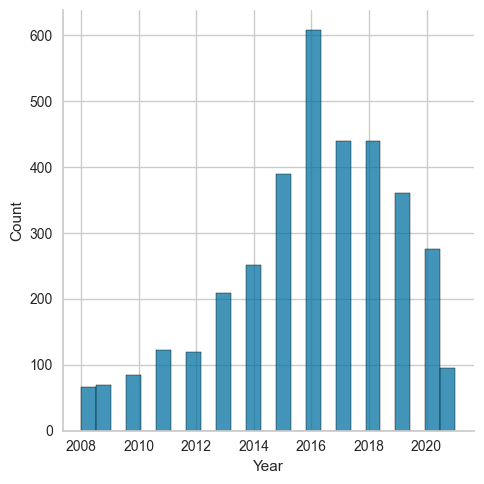

In [173]:
# Trimming outlier on 'Year' column
df_model[['Year']] = OutlierTrimmer(capping_method='mad', tail='left').fit_transform(df_model[['Year']])
df_model.dropna(inplace=True)

# Plotting distribution after trimming
sns.displot(data=df_model['Year'])
plt.show()

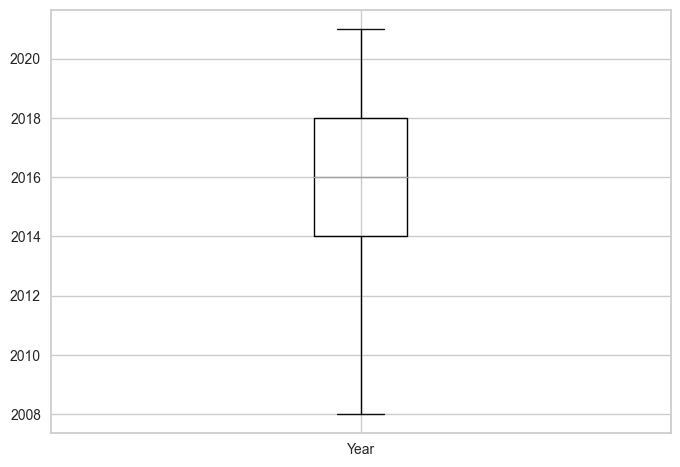

In [174]:
plt.show(df_model.boxplot(column='Year'))

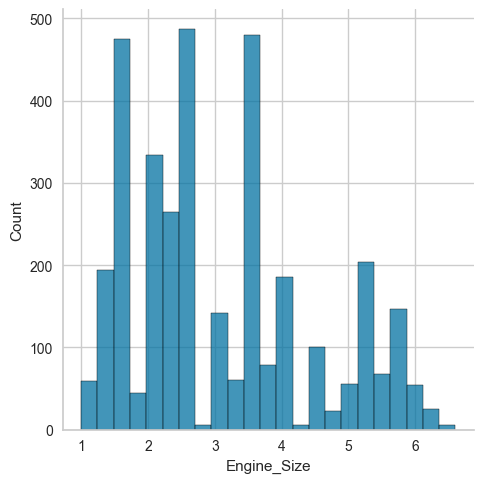

In [175]:
# Trimming outlier on 'Engine_Size' column
df_model[['Engine_Size']] = OutlierTrimmer(capping_method='mad', tail='right').fit_transform(df_model[['Engine_Size']])
df_model.dropna(inplace=True)

# Plotting distribution after trimming
sns.displot(data=df_model['Engine_Size'])
plt.show()

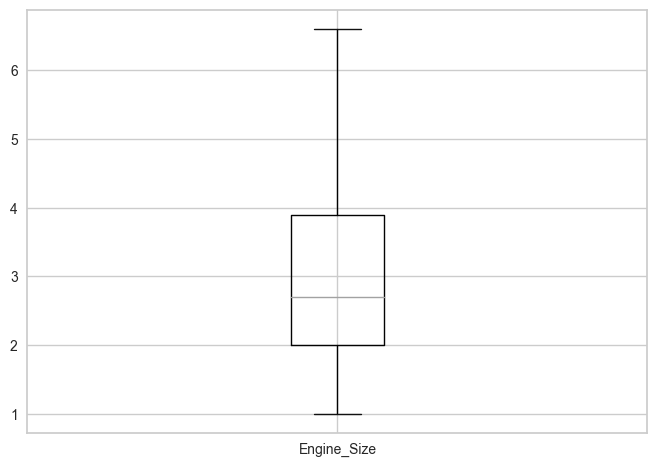

In [176]:
plt.show(df_model.boxplot(column='Engine_Size'))

Karena kolom `Year` dan `Engine_Size` sebenarnya bertipe diskrit, transformasi tidak dapat mengubah distribusi data secara signifikan.

### Outlier: `Mileage`

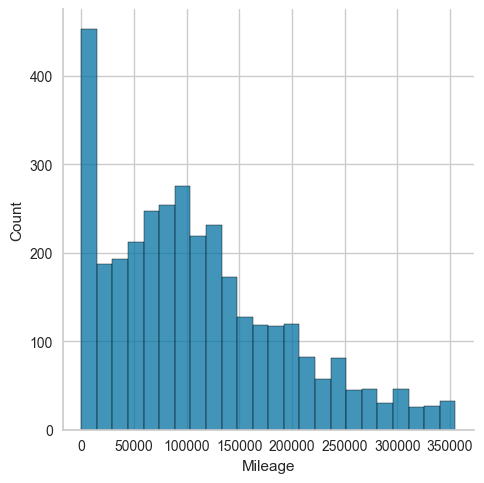

In [177]:
# Trimming outlier on 'Mileage' column
df_model[['Mileage']] = OutlierTrimmer(capping_method='mad', tail='right').fit_transform(df_model[['Mileage']])
df_model.dropna(inplace=True)

# Plotting distribution after trimming
sns.displot(data=df_model['Mileage'])
plt.show()

Setelah menghilangkan *outlier*, distribusi `Mileage` masih menunjukkan adanya frekuensi data yang tinggi pada *tail* sebelah kiri. Untuk menciptakan distribusi data yang mendekati normal, data di bawah ambang batas tertentu juga akan dihapuskan (berdasarkan eksperimentasi untuk mencari *threshold* sekecil mungkin).

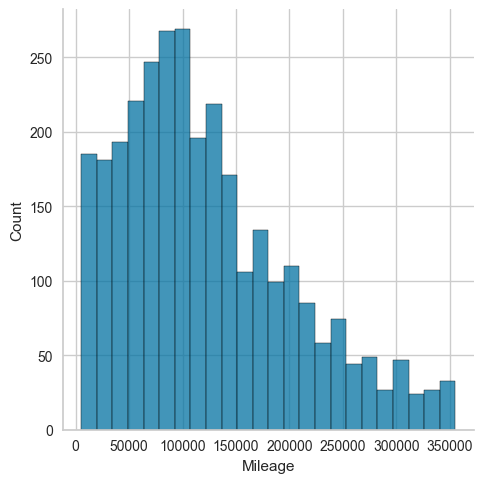

In [178]:
# Filtering 'Mileage' below 5000
df_model = df_model[df_model['Mileage'] > 5000]

# Plotting distribution after filtering
sns.displot(data=df_model['Mileage'])
plt.show()

Langkah berikutnya adalah mentransformasikan kolom tersebut. Berdasarkan eksperimentasi, ditemukan *square root transformation* yang menghasilkan persebaran data paling dekat dengan distribusi normal (secara visual berdasarkan histogram dan Q-Q plot)

Transformasi ini nantinya akan disertakan ke dalam *pipeline*, sehingga langkah ini tidak akan langsung diterapkan pada dataset pemodelan.

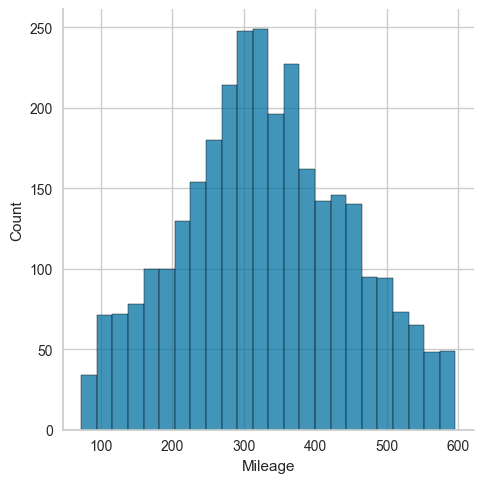

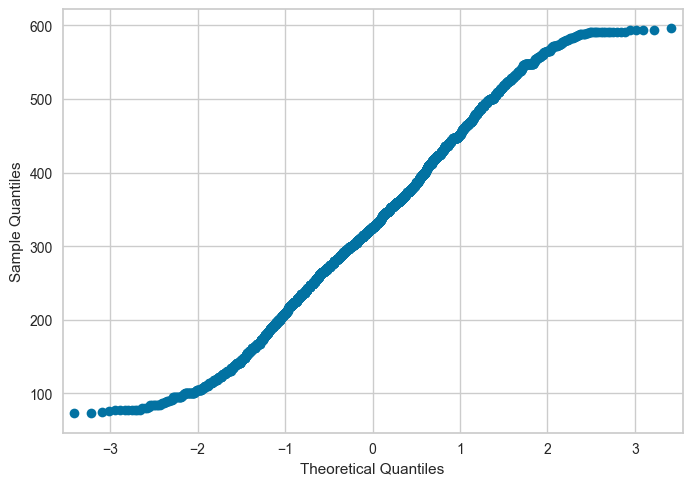

In [179]:
# Transforming 'Mileage' using square root
holdout_transform = FunctionTransformer(func=lambda x: np.sqrt(x), 
                                        inverse_func=lambda x: np.square(x), 
                                        check_inverse=True)\
                                            .fit_transform(df_model[['Mileage']])

# Plotting distribution after transformation
sns.displot(data=holdout_transform, x='Mileage')
sm.qqplot(data=holdout_transform['Mileage'])
plt.show()

### Outlier: `Price`

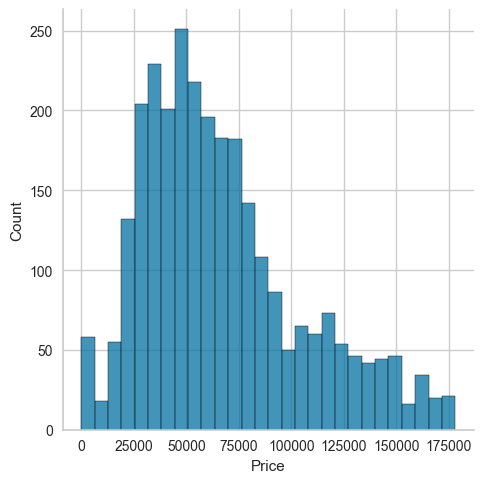

In [180]:
# Handling outlier on 'Price' column
df_model[['Price']] = OutlierTrimmer(capping_method='mad', tail='right').fit_transform(df_model[['Price']])
df_model.dropna(inplace=True)

sns.displot(data=df_model['Price'])
plt.show()

Serta berdasarkan temuan sebelumnya, data pada kolom `Price` di bawah ambang batas tertentu tidak akan disertakan.

*Domain knowledge* juga mengindikasikan bahwa terdapat `Price` yang tidak masuk akal (misalnya mobil bekas dengan harga hanya SAR 1 atau setara ~4000 Rupiah pada dataset ini). Ditambah dengan referensi dari website [Syarah](https://syarah.com/en/filters?condition_id=0#referral_location=Home&browse_variant=view_all&variant_value=view%20all) yang menunjukkan harga mobil bekas mereka yang paling rendah berkisar di angka SAR 25.000.  
Ini masih berupa harga jual, dan bukan harga beli mobil yang ditawarkan pihak ketiga kepada Syarah. Karena kurangnya informasi yang dapat memberikan kisaran harga beli mobil bekas dari Syarah, atau berapa margin yang mereka tetapkan dari harga mobil bekas ini, diasumsikan bahwa *threshold* harga mobil bekas sebenarnya dimulai dari rentang SAR 21.000 ke atas.

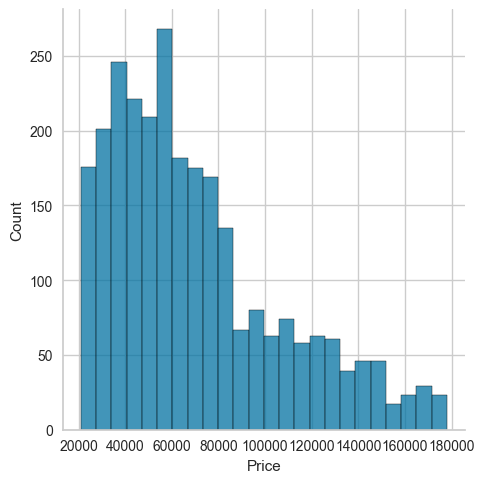

In [181]:
# Filtering 'Mileage' below 5000
df_model = df_model[df_model['Price'] > 20000]

# Plotting distribution after filtering
sns.displot(data=df_model['Price'])
plt.show()

## Rare Label & Cardinality

### `Type`

In [182]:
# Measuring frequency of labels in 'Type' column
display(df_model['Type'].value_counts(normalize=True).round(decimals=5).to_dict())
print(f'''Unique Value(s): {np.count_nonzero(df_model['Type'].unique())}''')

{'Accent': 0.04942,
 'Camry': 0.03632,
 'Taurus': 0.03557,
 'Sonata': 0.03519,
 'Hilux': 0.03482,
 'Tahoe': 0.0307,
 'Elantra': 0.02995,
 'Corolla': 0.02508,
 'Expedition': 0.02284,
 'Yukon': 0.02097,
 'Furniture': 0.01947,
 'Pajero': 0.01909,
 'Prado': 0.01872,
 'Sunny': 0.01797,
 'Accord': 0.01797,
 'Yaris': 0.0176,
 'Land Cruiser': 0.01685,
 'ES': 0.01423,
 'Charger': 0.01235,
 'Innova': 0.01198,
 'Cerato': 0.01161,
 'C': 0.01161,
 'Impala': 0.01161,
 'Sierra': 0.01123,
 '6': 0.01048,
 'Caprice': 0.01011,
 'CX9': 0.00973,
 'Tucson': 0.00973,
 'Senta fe': 0.00973,
 'Azera': 0.00936,
 'Avalon': 0.00936,
 'Patrol': 0.00899,
 'Datsun': 0.00861,
 'Optima': 0.00824,
 'Cadenza': 0.00786,
 'Hiace': 0.00786,
 'Altima': 0.00786,
 'FJ': 0.00786,
 'Land Cruiser Pickup': 0.00749,
 'Rav4': 0.00749,
 'Sportage': 0.00749,
 'Explorer': 0.00711,
 'H1': 0.00674,
 'Rio': 0.00674,
 'Suburban': 0.00636,
 'Malibu': 0.00636,
 'C300': 0.00599,
 'Range Rover': 0.00599,
 'E': 0.00599,
 '3': 0.00562,
 'Grand C

Unique Value(s): 254


Berdasarkan proporsi dari tiap label pada kolom `Type`, tampak bahwa mayoritas label memiliki persentase yang rendah. Ditambah dengan jumlah label yang relatif tinggi (279 label; *high cardinality*) berpotensi menjadi *noise* di dalam model dan menyebabkan *overfitting*.

Untuk *high cardinality* dalam kolom ini ditangani dengan mengkategorikan ulang label dengan frekuensi yang rendah ke dalam kategori baru yang diberi nama `Rare`. Umumnya angka di bawah 5% (0.05) dinilai dapat menyebabkan *overfitting*, namun dengan melihat distribusi frekuensi di atas, diputuskan untuk menyesuaikan ambang batas tersebut menjadi 0.1% (0.001).

In [183]:
# Engineering rare labels in 'Type' column
df_model[['Type']] = RareLabelEncoder(tol=0.01).fit_transform(df_model[['Type']])

# Validating engineering process
display(df_model['Type'].value_counts(normalize=True).round(decimals=5).to_dict())
print(f"Unique value(s): {np.count_nonzero(a=df_model['Type'].unique())}")

{'Rare': 0.44627,
 'Accent': 0.04942,
 'Camry': 0.03632,
 'Taurus': 0.03557,
 'Sonata': 0.03519,
 'Hilux': 0.03482,
 'Tahoe': 0.0307,
 'Elantra': 0.02995,
 'Corolla': 0.02508,
 'Expedition': 0.02284,
 'Yukon': 0.02097,
 'Furniture': 0.01947,
 'Pajero': 0.01909,
 'Prado': 0.01872,
 'Sunny': 0.01797,
 'Accord': 0.01797,
 'Yaris': 0.0176,
 'Land Cruiser': 0.01685,
 'ES': 0.01423,
 'Charger': 0.01235,
 'Innova': 0.01198,
 'C': 0.01161,
 'Impala': 0.01161,
 'Cerato': 0.01161,
 'Sierra': 0.01123,
 '6': 0.01048,
 'Caprice': 0.01011}

Unique value(s): 27


### `Region`

In [184]:
# Measuring frequency of labels in 'Region' column
display(df_model['Region'].value_counts(normalize=True))
print(f'''Unique Value(s): {np.count_nonzero(df_model['Region'].unique())}''')

Region
Riyadh            0.458255
Dammam            0.214526
Jeddah            0.134781
Al-Ahsa           0.031449
Qassim            0.029203
Al-Medina         0.027331
Aseer             0.018345
Makkah            0.013478
Khobar            0.013104
Jubail            0.008985
Taef              0.007113
Jazan             0.007113
Tabouk            0.007113
Abha              0.005241
Hail              0.004493
Al-Baha           0.003370
Yanbu             0.002621
Hafar Al-Batin    0.002246
Najran            0.002246
Al-Jouf           0.002246
Al-Namas          0.002246
Arar              0.001123
Sakaka            0.001123
Wadi Dawasir      0.000749
Besha             0.000749
Sabya             0.000374
Qurayyat          0.000374
Name: proportion, dtype: float64

Unique Value(s): 27


Hal yang serupa diterapkan pada kolom `Region`, dengan menggunakan *threshold* 0.5% (0.005).

In [185]:
# Engineering rare labels in 'Region' column
df_model[['Region']] = RareLabelEncoder(tol=0.005).fit_transform(df_model[['Region']])

# Validating engineering process
display(df_model['Region'].value_counts(normalize=True).round(decimals=5).to_dict())
print(f"Unique value(s): {np.count_nonzero(a=df_model['Region'].unique())}")

{'Riyadh': 0.45826,
 'Dammam': 0.21453,
 'Jeddah': 0.13478,
 'Al-Ahsa': 0.03145,
 'Qassim': 0.0292,
 'Al-Medina': 0.02733,
 'Rare': 0.02396,
 'Aseer': 0.01835,
 'Makkah': 0.01348,
 'Khobar': 0.0131,
 'Jubail': 0.00899,
 'Jazan': 0.00711,
 'Tabouk': 0.00711,
 'Taef': 0.00711,
 'Abha': 0.00524}

Unique value(s): 15


### `Make`

In [186]:
# Measuring frequency of labels in 'Make' column
display(df_model['Make'].value_counts(normalize=True))
print(f'''Unique Value(s): {np.count_nonzero(df_model['Make'].unique())}''')

Make
Toyota        0.233246
Hyundai       0.157619
Ford          0.098091
Chevrolet     0.081243
Nissan        0.065893
Kia           0.052415
GMC           0.035942
Mazda         0.029951
Mercedes      0.028079
Lexus         0.027705
Honda         0.027331
Mitsubishi    0.022089
Dodge         0.018345
BMW           0.015350
Jeep          0.010857
Chrysler      0.009734
Genesis       0.009734
Audi          0.007862
Changan       0.007488
Renault       0.006365
Land Rover    0.005990
Cadillac      0.005616
Volkswagen    0.005616
Geely         0.004867
MG            0.003370
Porsche       0.003370
MINI          0.002621
Lincoln       0.002621
INFINITI      0.002246
Suzuki        0.002246
HAVAL         0.002246
Fiat          0.001872
Jaguar        0.001872
Isuzu         0.001872
Peugeot       0.001498
GAC           0.001123
Daihatsu      0.000749
Maserati      0.000749
Foton         0.000749
FAW           0.000749
Lifan         0.000374
Bentley       0.000374
BYD           0.000374
Zhengz

Unique Value(s): 47


Serta pada kolom `Make` dengan *threshold* 0.1%.

In [187]:
# Engineering rare labels in 'Make' column
df_model[['Make']] = RareLabelEncoder(tol=0.01).fit_transform(df_model[['Make']])

# Validating engineering process
display(df_model['Make'].value_counts(normalize=True).round(decimals=5))
print(f'''Unique Value(s): {np.count_nonzero(df_model['Make'].unique())}''')

Make
Toyota        0.23325
Hyundai       0.15762
Ford          0.09809
Rare          0.09584
Chevrolet     0.08124
Nissan        0.06589
Kia           0.05241
GMC           0.03594
Mazda         0.02995
Mercedes      0.02808
Lexus         0.02770
Honda         0.02733
Mitsubishi    0.02209
Dodge         0.01835
BMW           0.01535
Jeep          0.01086
Name: proportion, dtype: float64

Unique Value(s): 16


## Preprocessing Result

In [188]:
# Checking preprocessed dataset
display(df_model.head())
df_model.info()

,Type,Region,Make,Gear_Type,Origin,Options,Year,Engine_Size,Mileage,Price
3,Rare,Rare,Kia,Automatic,Saudi,Semi Full,2015.0,2.4,220000.0,42000.0
5,Rare,Abha,Mazda,Automatic,Saudi,Semi Full,2019.0,2.0,25000.0,58000.0
6,Rare,Riyadh,Rare,Automatic,Saudi,Full,2012.0,4.8,189000.0,85000.0
8,Rare,Riyadh,Toyota,Automatic,Saudi,Standard,2016.0,3.5,110864.0,81500.0
11,Land Cruiser,Riyadh,Toyota,Automatic,Saudi,Full,2011.0,4.6,79000.0,145000.0


<class 'pandas.core.frame.DataFrame'>
Index: 2671 entries, 3 to 5622
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Type         2671 non-null   object 
 1   Region       2671 non-null   object 
 2   Make         2671 non-null   object 
 3   Gear_Type    2671 non-null   object 
 4   Origin       2671 non-null   object 
 5   Options      2671 non-null   object 
 6   Year         2671 non-null   float64
 7   Engine_Size  2671 non-null   float64
 8   Mileage      2671 non-null   float64
 9   Price        2671 non-null   float64
dtypes: float64(4), object(6)
memory usage: 229.5+ KB


In [189]:
# Comparing dataset
print(f'Original Dataset Rows, Columns: {df_data.shape[0]}, {df_data.shape[1]}')
print(f'Model Dataset Rows, Columns: {df_model.shape[0]}, {df_model.shape[1]}')
print(f'Model Data Percentage: {round(number=((df_model.shape[0] / df_data.shape[0])) * 100, ndigits=1)}%')


Original Dataset Rows, Columns: 5624, 11
Model Dataset Rows, Columns: 2671, 10
Model Data Percentage: 47.5%


47.5% dari dataset awal yang digunakan dalam pemodelan pada tahapan berikutnya. Dengan kata lain, batasan dari model terdefinisikan dalam data pemodelan, dan di luar data ini, hasil prediksi nantinya akan menjadi bias.

---

# Modeling

In [190]:
# Importing libraries for modeling
from sklearn.model_selection import train_test_split
from pycaret.internal.preprocess.transformers import TransformerWrapper
from category_encoders import BinaryEncoder
from category_encoders import OrdinalEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import FunctionTransformer
from sklearn.preprocessing import StandardScaler
from pycaret.regression import *
from sklearn.feature_selection import SelectKBest, f_regression
from PIL import Image

### Environment Setup

In [191]:
# Setting arbitrary number to 'random_state'
random_state = 1

# Splitting dataset into dataframes for training and testing
df_seen, df_unseen = train_test_split(df_model, random_state=random_state)

`random_state` diperlukan untuk mengendalikan sampling/pengacakan yang diterapkan pada data sebelum dipisah menjadi data *train & test* (serta *validation*); agar hasil *splitting* selalu sama setiap kali kode pemrograman pada pemodelan ini dijalankan.

In [192]:
# Creating custom pipeline for modeling
pipeline = [
    ('binary', TransformerWrapper(
        include=['Type'], 
        transformer=BinaryEncoder())),
    ('ordinal', TransformerWrapper(
        include=['Options'], 
        transformer=OrdinalEncoder(mapping=[{'col': 'Options', 'mapping': {'Standard': 0, 'Semi Full': 1, 'Full': 2}}]))),
    ('onehot', TransformerWrapper(
        include=['Region', 'Make', 'Gear_Type', 'Origin'], 
        transformer=OneHotEncoder(drop='first'))),
    ('minmax', TransformerWrapper(
        include=['Year', 'Engine_Size'], 
        transformer=MinMaxScaler())),
    ('squareroot', TransformerWrapper(
        include=['Mileage'], 
        transformer=FunctionTransformer(func=np.sqrt, inverse_func=np.square, check_inverse=True))),
    ('standard', TransformerWrapper(
        include=['Mileage'], 
        transformer=StandardScaler()))
]

Penjelasan dari *pipeline* ini sebagai berikut:
1. `BinaryEncoder` diterapkan pada `Type` karena *cardinality* pada kolom ini masih tinggi, meskipun telah diberikan penanganan pada tahapan sebelumnya.
2. `OrdinalEncoder` diterapkan pada `Options` dengan mengatur tingkat urutan (*order*) dari kelengkapan fitur suatu mobil: *Standard < Semi Full < Full*.
3. Kolom kategorikal lainnya bisa menggunakan `OneHotEncoder`:
    * Dapat diterapkan pada kolom `Region` dan `Make` karena *cardinality* kedua kolom ini berkisar di angka 15.
    * `drop='first'` sebagai penerapan *degrees of freedom (k-1)* pada model regresi linier.
4. `MinmaxScaler` dapat diterapkan pada `Year` & `Engine_Size` karena tahapan sebelumnya telah menghilangkan *outlier* di kedua kolom ini.
5. `StandardScaler` dapat diterapkan pada `Mileage` karena tahapan sebelumnya telah mengubah distribusi data pada kolom ini hingga mendekati distribusi normal.

Berikutnya kita mulai eksperimentasi untuk mencari model terbaik dengan menggunakan PyCaret.

## Model Experimentation

### Experiment #1: Best Model

In [193]:
# Initialize model training environment
experiment1 = setup(data=df_seen, 
                    target='Price',
                    preprocess=False, # Disabling PyCaret's in-built preprocessing pipeline
                    custom_pipeline=pipeline, # Using previous custom pipeline
                    session_id=random_state # Using previous random state for train-validation splitting
                    )

,Description,Value
0,Session id,1
1,Target,Price
2,Target type,Regression
3,Original data shape,"(2003, 10)"
4,Transformed data shape,"(2003, 42)"
5,Transformed train set shape,"(1402, 42)"
6,Transformed test set shape,"(601, 42)"
7,Numeric features,3
8,Categorical features,6


In [194]:
# Validating usage of custom pipeline
experiment1.get_config(variable='pipeline')

Pipeline(memory=FastMemory(location=C:\Users\GARUDA~1\AppData\Local\Temp\joblib),
         steps=[('binary',
                 TransformerWrapper(transformer=TransformerWrapper(include=['Type'],
                                                                   transformer=BinaryEncoder(cols=['Type'],
                                                                                             mapping=[{'col': 'Type',
                                                                                                       'mapping':      Type_0  Type_1  Type_2  Type_3  Type_4
 1        0       0       0       0       1
 2        0       0       0       1       0
 3        0       0       0       1       1
 4        0       0       1       0       0
 5        0       0       1       0       1
 6        0       0       1       1       0
 7        0       0       1       1       1
 8        0       1       0       0       0
 9        0       1       0       0       1
 10       0       1       0       1       0
 11       0       1       0       1       1
 12       0       1       1       0       0
 13       0       1       1       0       1...
                 TransformerWrapper(transformer=TransformerWrapper(include=['Year',
                                                                            'Engine_Size'],
                                                                   transformer=MinMaxScaler()))),
                ('squareroot',
                 TransformerWrapper(transformer=TransformerWrapper(include=['Mileage'],
                                                                   transformer=FunctionTransformer(func=<ufunc 'sqrt'>,
                                                                                                   inverse_func=<ufunc 'square'>)))),
                ('standard',
                 TransformerWrapper(transformer=TransformerWrapper(include=['Mileage'],
                                                                   transformer=StandardScaler())))])

In [195]:
# Validating feature transformation using custom pipeline
X_train_transformed = experiment1.get_config(variable='X_train_transformed')
display(X_train_transformed)

,Type_0,Type_1,Type_2,Type_3,Type_4,Region_Al-Ahsa,Region_Al-Medina,Region_Aseer,Region_Dammam,Region_Jazan,...,Make_Nissan,Make_Rare,Make_Toyota,Gear_Type_Manual,Origin_Other,Origin_Saudi,Options,Year,Engine_Size,Mileage
3625,0,0,0,0,1,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,1,0.000000,0.185185,0.729222
3784,0,0,0,1,0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,1,0.692307,0.277778,-0.248704
4720,0,0,0,0,1,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0.615387,0.777778,-0.234488
2223,0,0,0,1,1,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.0,1.0,2,0.461533,0.314815,1.173652
2875,0,0,1,0,0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0,0.307693,0.462963,-0.498602
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3668,1,0,0,1,0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0.769226,0.462963,-0.716741
49,0,0,0,0,1,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,1.0,1,0.615387,0.703704,1.917768
1471,1,0,0,1,0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,2,0.615387,0.462963,-0.992136
1237,0,0,0,0,1,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,1,0.538452,0.240741,0.524581


Setelah kita berhasil mentransformasi data *train*, berikutnya dapat digunakan untuk pemodelan regresi.  
PyCaret menyediakan kumpulan (*library*) model yang dapat diakses dengan fungsi `compare_models()`, sehingga kita bisa membandingkan performa serangkaian model dan memilih beberapa *estimator* saja sebagai *benchmark* untuk tahapan pemodelan berikutnya.

In [196]:
# Removing unused metric
experiment1.remove_metric('rmsle')

# Comparing performances of models available in PyCaret
holdout_experiment1 = experiment1.compare_models()

,Model,MAE,MSE,RMSE,R2,MAPE,TT (Sec)
catboost,CatBoost Regressor,10961.6922,262275981.7355,16152.5356,0.7960,0.1736,1.8140
lightgbm,Light Gradient Boosting Machine,11943.6895,300840575.0277,17310.1008,0.7663,0.1872,0.3070
et,Extra Trees Regressor,11752.9487,323553666.0740,17901.2702,0.7485,0.1908,0.5860
gbr,Gradient Boosting Regressor,12712.2017,332508764.4650,18192.5125,0.7416,0.2028,0.2230
rf,Random Forest Regressor,12435.6825,348400199.3607,18576.2874,0.7286,0.1970,0.6030
lasso,Lasso Regression,15270.7220,428164253.9872,20661.6344,0.6680,0.2520,0.1120
llar,Lasso Least Angle Regression,15270.7228,428164794.6723,20661.6451,0.6680,0.2520,0.1510
lr,Linear Regression,15278.3635,428514002.1688,20669.7667,0.6677,0.2522,1.5400
br,Bayesian Ridge,15309.0618,430851174.9598,20729.7930,0.6659,0.2521,0.1450
ridge,Ridge Regression,15360.5124,434081788.1890,20808.5322,0.6634,0.2527,0.1000


Processing:   0%|          | 0/81 [00:00<?, ?it/s]

Kita dapatkan `CatBoost Regressor` sebagai yang terbaik dari keseluruhan model dalam PyCaret sehingga kita tetapkan model ini sebagai *benchmark*.

In [197]:
# Assigning 'CatBoost Regressor' as best model
best_model = create_model(estimator='catboost', 
                          return_train_score=True) # Viewing cross validation score

Processing:   0%|          | 0/4 [00:00<?, ?it/s]

Namun terdeteksi adanya *overfitting* dalam model ini: metrik yang tinggi di data *train* menandakan bahwa model memberikan prediksi yang akurat pada data tersebut; namun skornya turun relatif signifikan di data *validation*, sehingga model tidak bisa memberikan prediksi yang reliabel untuk data baru.

Untuk menanggulanginya, kita coba terapkan *hyperparameter tuning* dengan melihat terlebih dahulu parameter yang telah digunakan dalam pemodelan.

In [198]:
# Accessing best model's applied parameter
plot_model(estimator=best_model, plot='parameter')

,Parameters
nan_mode,Min
eval_metric,RMSE
iterations,1000
sampling_frequency,PerTree
leaf_estimation_method,Newton
random_score_type,NormalWithModelSizeDecrease
grow_policy,SymmetricTree
penalties_coefficient,1
boosting_type,Plain
model_shrink_mode,Constant


*Hyperparameter space* berikut mengacu pada [dokumentasi](https://catboost.ai/en/docs/concepts/parameter-tuning) dari CatBoost dan berfokus pada *tuning* untuk mengatasi *overfitting* dengan mengubah parameter yang telah digunakan model. Algoritma *Exhaustive Grid Search* dapat digunakan untuk memaksimalkan nilai *cross validation* tersebut, dengan cara mengiterasi seluruh kandidat yang ada dalam *hyperparameter space*. Namun untuk membatasi *training time*, hanya satu *hyperparameter* yang digunakan yakni `learning_rate`.

In [199]:
# Potential hyperparameter space to reduce overfitting
parameters = {
    'learning_rate': [0.01, 0.02, 0.03, 0.04],
    # 'depth': [7, 8, 9, 10],
    # 'l2_leaf_reg': [1, 2, 4, 5],
    # 'random_strength': [0, 2, 3, 4],
    # 'grow_policy': ['Depthwise', 'Lossguide']
}

# Tune model using custom hyperparameter
tuned_model= tune_model(estimator=best_model, 
                        custom_grid=parameters,
                        search_algorithm='grid',
                        return_train_score=True
                        )

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,23:20:28
Status,. . . . . . . . . . . . . . . . . .,Loading Dependencies
Estimator,. . . . . . . . . . . . . . . . . .,Compiling Library


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 4 candidates, totalling 40 fits


Percobaan ini hanya sedikit mereduksi efek *overfitting* pada model: rentang nilai *cross validation* masih relatif tinggi untuk data *train & validation*, meskipun metrik evaluasinya sedikit meningkat. Eksperimentasi berikutnya mencoba untuk mengurangi *overfitting* dengan menseleksi *feature* yang digunakan model.

### Experiment #2: Feature Selection

In [200]:
# Creating custom pipeline for next experimentation
pipeline2 = [
    ('binary', TransformerWrapper(
        include=['Type'], 
        transformer=BinaryEncoder())),
    ('ordinal', TransformerWrapper(
        include=['Options'], 
        transformer=OrdinalEncoder(mapping=[{'col': 'Options', 'mapping': {'Standard': 0, 'Semi Full': 1, 'Full': 2}}]))),
    ('onehot', TransformerWrapper(
        include=['Region', 'Make', 'Gear_Type', 'Origin'], 
        transformer=OneHotEncoder(drop='first'))),
    ('minmax', TransformerWrapper(
        include=['Year', 'Engine_Size'], 
        transformer=MinMaxScaler())),
    ('squareroot', TransformerWrapper(
        include=['Mileage'], 
        transformer=FunctionTransformer(func=np.sqrt, inverse_func=np.square, check_inverse=True))),
    ('standard', TransformerWrapper(
        include=['Mileage'], 
        transformer=StandardScaler())),
    ('selectkbest', TransformerWrapper(
        transformer=SelectKBest(score_func=f_regression, k=10)))
]

# Initialize model training environment
experiment2 = setup(data=df_seen, 
                    target='Price',
                    preprocess=False, # Disabling PyCaret's in-built preprocessing pipeline
                    custom_pipeline=pipeline2, # Using previous custom pipeline
                    session_id=random_state # Using previous random state for train-validation splitting
                    )

,Description,Value
0,Session id,1
1,Target,Price
2,Target type,Regression
3,Original data shape,"(2003, 10)"
4,Transformed data shape,"(2003, 11)"
5,Transformed train set shape,"(1402, 11)"
6,Transformed test set shape,"(601, 11)"
7,Numeric features,3
8,Categorical features,6


*Feature selection* untuk eksperimentasi ini berdasarkan metode *filter* dan nilai `f_statistic` dari tiap *feature*. Beberapa kali percobaan telah dilakukan untuk mencari nilai `k` atau kombinasi *feature* yang menghasilkan metrik terbaik, dan ditemukan pada angka `k=10`

In [201]:
# Removing unused metric
experiment2.remove_metric('rmsle')

# Viewing result of second experimentation
selected_model = experiment2.create_model(estimator='catboost', return_train_score=True)

Processing:   0%|          | 0/4 [00:00<?, ?it/s]

Hasil eksperimen ini tidak menunjukkan adanya perubahan pada efek *overfitting*: selisih keseluruhan skor pada data *train & validation* masih relatif tinggi.  
*Feature selection* mengurangi dimensi dari model —karena pada percobaan ini hanya menggunakan 10 *feature* dengan nilai `f_statistic` tertinggi—, sehingga metrik evaluasinya pun ikut menurun. Oleh sebab itu, diputuskan untuk memilih hasil eksperimentasi awal (setelah dilakukan *tuning*) menuju *final model*.

## Model Evaluation

### Graphical Plot

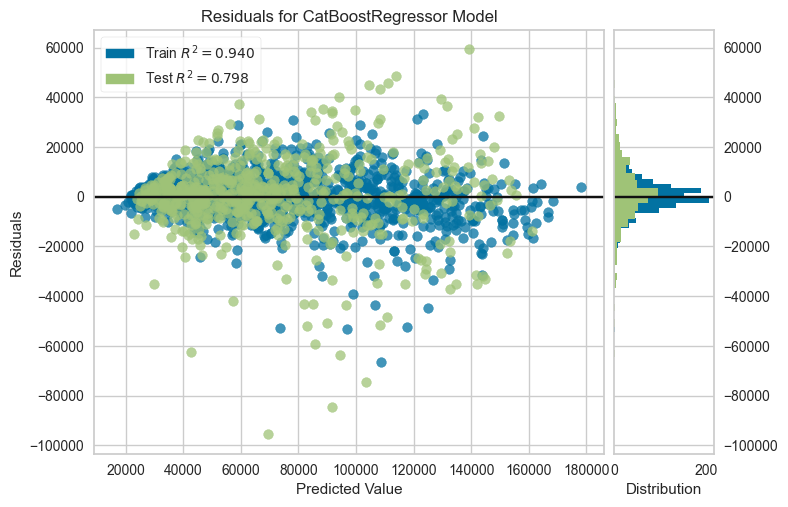

In [202]:
# Showing residual plot
experiment1.plot_model(estimator=tuned_model)

Grafik *residual* pada data *test* menunjukkan bahwa:
1. Histogram di sisi kanan grafik menunjukkan *residual* yang terdistribusi normal dan berpusat di titik 0. Dengan kata lain, rata-rata dari kesalahan atau *error* adalah 0 dan menunjukkan sifat variansi yang bernilai minimum atau *unbiased*
2. Distribusi titik residual tersebar secara acak (titik yang berpusat pada garis 0 merepresentasikan standar deviasi *error* bernilai kecil), yang menunjukkan adanya *homoscedasticity*; asumsi linearitas pada model terpenuhi, sehingga kita bisa menggunakan metrik berikutnya, yakni
3. Nilai R2 menurun sekitar 14% pada data *test*, sehingga model dikatakan *overfit*

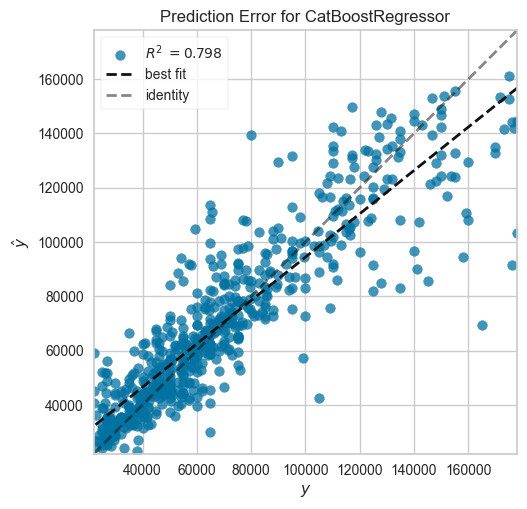

In [203]:
# Showing prediction error plot
experiment1.plot_model(estimator=tuned_model, plot='error')

Grafik error pada data *test* menunjukkan bahwa:
1. Terdapat beberapa titik data yang melenceng jauh dari nilai aktualnya (garis optimal atau *best fit*), sehingga nilai kesalahan prediksinya pun semakin membesar.
2. Tetapi banyak titik data yang tersebar dan teratur di sekitar garis optimal. Hal ini disebabkan adanya *irreducible noise*, atau variasi target yang tidak sepenuhnya dapat dijelaskan oleh *feature*. Hal ini sifatnya realistis, jika dibandingkan dengan model regresi yang sempurna (titik data berada pada garis optimal).

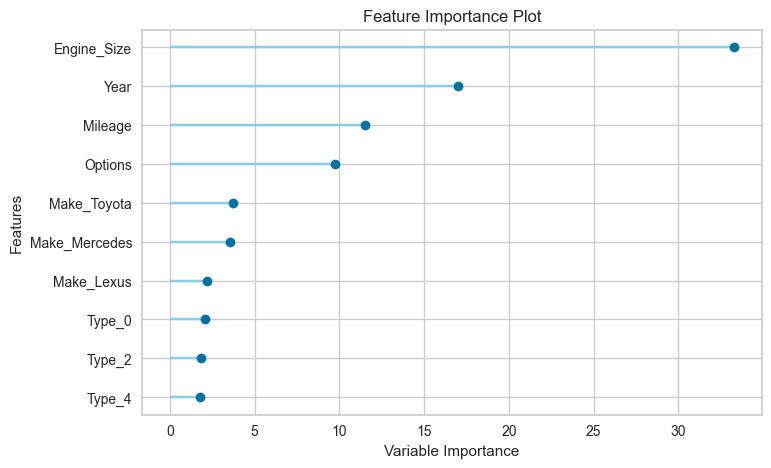

In [204]:
# Showing prediction error plot
experiment1.plot_model(estimator=tuned_model, plot='feature')

*(Grafik tidak menunjukkan keseluruhan variabel yang digunakan. Informasi lebih lengkap dapat dilihat berikut ini)*

In [205]:
# Showing numerical value of feature importance (coefficient)
tuned_model_coefficient = pd.DataFrame({'Feature': experiment1.get_config('X_train_transformed').columns.tolist(),
                                        'Coefficient': tuned_model.feature_importances_})\
                                          .sort_values(by='Coefficient', ascending=False)

display(tuned_model_coefficient)

,Feature,Coefficient
39,Engine_Size,33.262954
38,Year,16.972061
40,Mileage,11.502775
37,Options,9.744191
33,Make_Toyota,3.719903
29,Make_Mercedes,3.538894
27,Make_Lexus,2.159745
0,Type_0,2.095233
2,Type_2,1.848129
4,Type_4,1.745520


CatBoost menggunakan `feature_importances`dengan metode [`PredictionValuesChange`](https://forecastegy.com/posts/catboost-feature-importance-python/) sebagai metode *default* dalam pemodelan regresi. Metode ini menghitung rata-rata perubahan prediksi (`ŷ`) saat nilai suatu *feature* berubah.  
Formula untuk menghitung nilai ini disediakan dalam [dokumentasi](https://catboost.ai/en/docs/concepts/fstr#regular-feature-importance) CatBoost. Sederhananya, semakin tinggi nilai `feature_importance` suatu variabel, semakin besar rata-rata perubahan nilai prediksi (jika variabel tersebut diubah).

### Limitation

Secara keseluruhan, batasan untuk model ini ditunjukkan dari kolom-kolom:
1. `Year` yang berada pada rentang tahun 2008 hingga 2021.
2. `Engine_Size` dengan rentang ukuran 1 hingga 6.4 (satuan unit).
3. `Mileage` dari 5.300 - 353.000 (satuan unit).
4. `Price` yang tidak bisa bernilai 0 (disertai indikatornya dalam `Negotiable`), serta dibatasi pada rentang SAR 20.000 hingga 178.000.
5. Label pada `Type`, `Region`, dan `Make` dengan frekuensi di bawah *threshold* tertentu dikategorikan ulang menjadi *rare label*, sehingga prediksi pada label tersebut akan menjadi bias. Semisal model mobil Ferrari memiliki harga yang jauh lebih tinggi daripada model Tata. Namun karena frekuensi data pada kedua mobil ini rendah, mereka sama-sama dikategorikan ke dalam model Rare.

## Model Prediction

Menggunakan model untuk prediksi terhadap *unseen data* (`df_unseen`), dilakukan dengan cara menggabungkan data *train & validation* melalui `finalize_model()` 

In [206]:
# Finalizing model
final_model = experiment1.finalize_model(estimator=tuned_model)

# Predict model on unseen, unlabeled data
df_unseen_unlabeled = df_unseen.copy()
df_unseen_unlabeled.drop('Price', axis=1, inplace=True)
predict_model(estimator=final_model, data=df_unseen_unlabeled)

,Type,Region,Make,Gear_Type,Origin,Options,Year,Engine_Size,Mileage,prediction_label
2295,Furniture,Riyadh,Toyota,Automatic,Saudi,Standard,2021.0,2.7,16444.0,112464.458208
2486,Rare,Jeddah,Mercedes,Automatic,Gulf Arabic,Full,2016.0,2.1,43000.0,137024.508163
4042,Rare,Riyadh,Chevrolet,Automatic,Gulf Arabic,Standard,2017.0,2.4,146000.0,50760.872115
3000,Accord,Jeddah,Honda,Automatic,Saudi,Semi Full,2018.0,1.6,32000.0,70306.896807
1230,Elantra,Riyadh,Hyundai,Automatic,Saudi,Standard,2019.0,1.6,120244.0,43482.651771
...,...,...,...,...,...,...,...,...,...,...
935,Innova,Riyadh,Toyota,Automatic,Saudi,Full,2017.0,2.7,175559.0,63421.513808
5205,Accent,Jeddah,Hyundai,Automatic,Saudi,Semi Full,2017.0,1.4,117000.0,31536.457280
455,Pajero,Riyadh,Mitsubishi,Automatic,Saudi,Standard,2012.0,3.8,86213.0,42205.690688
3002,Pajero,Al-Ahsa,Mitsubishi,Automatic,Saudi,Semi Full,2015.0,3.5,99000.0,53610.332314


### Prediction Analysis

,Model,MAE,MSE,RMSE,R2,MAPE
0,CatBoost Regressor,11602.2127,333318228.5854,18257.0049,0.7680,0.1827


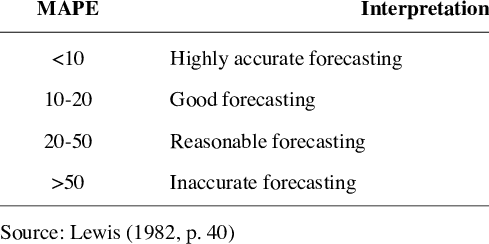

In [207]:
# Using labeled unseen data for analysis
df_prediction = predict_model(estimator=final_model, data=df_unseen)

# Loading analysis reference
Image.open('interpretation-of-typical-MAPE-values.png')

Dengan nilai `MAPE` 0.1827 atau 18.27% pada `final_model`, hasil prediksi ini dapat dikategorikan sebagai *Good forecasting* (Lewis, C. D. (1982). *Industrial and business forecasting methods: A practical guide to exponential smoothing and curve fitting*).

Analisis berikutnya menelaah *residual* atau kesalahan prediksi dari model, yang dikategorikan ke dalam *overpredict* (nilai prediksi `Price` lebih besar daripada nilai aktual `Price`) dan *underpredict* (prediksi lebih kecil daripada aktual).

In [208]:
# Renaming & rounding columns for easier interpretation
df_prediction.rename(mapper={'Price': 'Actual Price',
                             'prediction_label': 'Predicted Price'}, axis=1, inplace=True)
df_prediction['Predicted Price'] = df_prediction['Predicted Price'].round(decimals=0)

# Adding residuals or 'Error' column
df_prediction['Prediction Error'] = df_prediction['Predicted Price'] - df_prediction['Actual Price']

# Separating overpredicted & underpredicted data
df_overpredict, df_underpredict = df_prediction[df_prediction['Prediction Error'] > 0], df_prediction[df_prediction['Prediction Error'] < 0]

# Showing overpredicted data & MAE
display(df_overpredict.sort_values(by='Prediction Error', ascending=False))
print(f"Overprediction MAE: SAR {int(round(number=df_overpredict['Prediction Error'].mean(), ndigits=0))}")

,Type,Region,Make,Gear_Type,Origin,Options,Year,Engine_Size,Mileage,Actual Price,Predicted Price,Prediction Error
4704,Rare,Riyadh,Nissan,Automatic,Saudi,Semi Full,2015.0,5.8,129500.0,40000.0,122703.0,82703.0
5410,Rare,Riyadh,Rare,Automatic,Saudi,Full,2018.0,3.0,109000.0,49000.0,121066.0,72066.0
1849,Rare,Riyadh,Honda,Automatic,Gulf Arabic,Full,2016.0,4.0,51000.0,43000.0,113834.0,70834.0
2180,Camry,Riyadh,Toyota,Automatic,Saudi,Full,2016.0,4.0,260000.0,53000.0,104173.0,51173.0
1782,Rare,Riyadh,Lexus,Automatic,Saudi,Full,2015.0,3.5,181000.0,60000.0,108493.0,48493.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2879,6,Jeddah,Mazda,Automatic,Saudi,Standard,2016.0,2.5,88350.0,50000.0,50284.0,284.0
2134,Prado,Dammam,Toyota,Automatic,Saudi,Full,2016.0,4.0,69900.0,128000.0,128241.0,241.0
1559,Prado,Aseer,Toyota,Automatic,Saudi,Semi Full,2015.0,4.0,160000.0,105000.0,105193.0,193.0
285,Taurus,Dammam,Ford,Automatic,Saudi,Semi Full,2012.0,3.5,327000.0,35000.0,35165.0,165.0


Overprediction MAE: SAR 10377


Ditemukan nilai rata-rata kesalahan prediksi model sebesar SAR 10.377. Dan sekilas tampak pada kesalahan prediksi yang besar diakibatkan oleh *rare label* pada `Type`.
Untuk mencari tahu lebih jauh tentang angka ini, kita dapat mencari nilai rerata kesalahan pada rentang `Price` tertentu, sebagaimana ditunjukkan dalam analisis berikut.

In [209]:
# Binning overpredicted 'Price'
df_overpredict['Binned Actual Price'] = pd.cut(x=df_overpredict['Actual Price'], 
                                               bins=5) # Using arbitrary number of bins
# Measuring MAE per bin
df_overpredict.groupby(by='Binned Actual Price').agg(func={'Prediction Error': 'mean'}).rename(mapper={'Prediction Error': 'Binned MAE'}, axis=1).round()

,Binned MAE
Binned Actual Price,
"(20864.5, 48100.0]",9963.0
"(48100.0, 75200.0]",10808.0
"(75200.0, 102300.0]",13544.0
"(102300.0, 129400.0]",8403.0
"(129400.0, 156500.0]",4956.0


Nilai rata-rata kesalahan paling rendah didapatkan dari prediksi `Price` pada kisaran rentang harga SAR 130.000 - 157.000, dengan nilai SAR ~5000. Sedangkan yang paling tinggi pada rentang harga SAR 75.000 - 102.000 dengan nilai SAR ~14.000 (dengan pembulatan untuk memudahkan interpretasi).  

Berikutnya kita bandingkan nilai ini dengan data yang dikategorikan *underpredict*.

In [210]:
# Showing undepredicted data & average residual value
display(df_underpredict.sort_values(by='Prediction Error'))
print(f"Underprediction MAE: SAR {int(abs(round(number=df_underpredict['Prediction Error'].mean(), ndigits=0)))}")

,Type,Region,Make,Gear_Type,Origin,Options,Year,Engine_Size,Mileage,Actual Price,Predicted Price,Prediction Error
3599,Rare,Riyadh,Ford,Automatic,Saudi,Standard,2010.0,6.0,35000.0,160000.0,42161.0,-117839.0
1659,Rare,Dammam,Rare,Automatic,Saudi,Full,2010.0,5.0,58000.0,175000.0,72152.0,-102848.0
3660,Rare,Dammam,BMW,Automatic,Gulf Arabic,Semi Full,2020.0,1.9,7800.0,177000.0,90440.0,-86560.0
443,Rare,Dammam,Mercedes,Automatic,Saudi,Full,2011.0,4.0,60000.0,170000.0,86705.0,-83295.0
3063,Rare,Riyadh,Rare,Automatic,Saudi,Semi Full,2015.0,3.0,125000.0,165000.0,88595.0,-76405.0
...,...,...,...,...,...,...,...,...,...,...,...,...
1784,Hilux,Makkah,Toyota,Manual,Saudi,Standard,2009.0,1.5,25788.0,30000.0,29681.0,-319.0
2888,Tahoe,Riyadh,Chevrolet,Automatic,Saudi,Standard,2011.0,5.3,143000.0,55000.0,54706.0,-294.0
5253,C,Dammam,Mercedes,Automatic,Saudi,Semi Full,2016.0,2.0,140000.0,105000.0,104775.0,-225.0
230,Expedition,Riyadh,Ford,Automatic,Saudi,Standard,2014.0,5.4,143000.0,60000.0,59861.0,-139.0


Underprediction MAE: SAR 13123


Kesalahan prediksi yang besar pada kategori ini, selain karena *rare label* pada `Type`, ditambah dengan `Price` aktual yang mendekati batas atas yang ditetapkan dalam pemodelan (SAR 178.000)

In [211]:
# Binning underpredicted 'Price'
df_underpredict['Binned Actual Price'] = pd.cut(x=df_underpredict['Actual Price'], 
                                               bins=5) # Using arbitrary number of bins
# Measuring MAE per bin
df_underpredict.groupby(by='Binned Actual Price')\
    .agg(func={'Prediction Error': 'mean'}).abs().round()\
        .rename(mapper={'Prediction Error': 'Binned MAE'}, axis=1)

,Binned MAE
Binned Actual Price,
"(24848.0, 55400.0]",4521.0
"(55400.0, 85800.0]",9470.0
"(85800.0, 116200.0]",11039.0
"(116200.0, 146600.0]",18811.0
"(146600.0, 177000.0]",36638.0


Nilai MAE untuk data *underpredict* sebesar SAR 13.000, serta MAE paling rendah pada rentang harga SAR 25.000 - 55.000 dan paling tinggi SAR 147.000 - 177.000.

---

# Conclusion

Berdasarkan pemodelan yang sudah dilakukan, fitur `Engine_Size`, `Year`, `Mileage`, dan `Options` adalah 4 fitur teratas yang paling berpengaruh terhadap 'Price'.

Metrik evaluasi yang digunakan pada model adalah nilai MAE, MSE & RMSE, serta MAPE. Jika ditinjau dari nilai MAPE yang dihasilkan oleh model setelah dilakukan *hyperparameter tuning*, yaitu sebesar ~18%, kita dapat menyimpulkan bahwa bila nanti model yang kita buat digunakan untuk memprediksi harga mobil bekas yang ditawarkan pada Syarah dalam rentang nilai seperti yang dilatih terhadap model (SAR 20.000 - 178.000), maka perkiraan harganya rata-rata akan meleset kurang lebih sebesar 18% dari harga seharusnya. 
 
Tetapi, tidak menutup kemungkinan bahwa prediksinya meleset lebih jauh, karena bias yang dihasilkan model masih cukup tinggi bila dilihat dari visualisasi dan analisis antara harga aktual dan prediksi. Bias yang dihasilkan oleh model ini dikarenakan batasan pada `Year`, `Engine_Size`, `Mileage`, serta terbatasnya jumlah data pada *rare label*, seperti data pada kolom `Type`, `Region`, dan `Make`.

## Recommendation

Model ini tentu masih dapat ditingkatkan, agar menghasilkan prediksi yang lebih baik lagi. Kita dapat melakukan *A/B testing* dari model ini untuk mengetahui tingkat kepuasan pelanggan sebelum dan setelah menggunakan model, ataupun peningkatan jumlah klien yang menjual mobilnya kepada Syarah. Dari hasil *A/B testing*, kita bisa mendapatkan temuan lainnya terkait hal-hal yang bisa dan harus diperbaiki pada model.

Penambahan data terkini untuk Syarah tentu akan dapat meningkatkan kapasitas prediksi dari model. Terutama pada data yang dikategorikan sebagai *rare label* dan data di luar batasan pemodelan (sehingga *limitation* dari model ini bisa berkurang).

In [212]:
# # Saving final_model
# save_model(model=final_model, model_name='final_model')

# # Saving df_seen, & df_unseen
# df_seen.to_csv(path_or_buf='df_seen.csv', index=False)
# df_unseen.to_csv(path_or_buf='df_unseen.csv', index=False)

# # Outputting version info for modules in this notebook
# import session_info
# session_info.show()

Transformation Pipeline and Model Successfully Saved
